## 05_Folium에서 다뤘던 Heatmap(열지도/온도지도)을 다른 패키지를 이용해서 만들어 보겠습니다.

## 관련 패키지 불러오기

In [1]:
import pandas as pd
import geopandas as gpd

c:\Users\thlee\AppData\Local\Programs\Python\Python39\lib\site-packages\geopandas\_compat.py:123: UserWarning: The Shapely GEOS version (3.10.1-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.3-CAPI-1.16.1). Conversions between both will be slow.
  warnings.warn(


In [25]:
#import matplotlib
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set_style('darkgrid') #whitegrid, dark, white, ticks
mpl.rc('font', family='Malgun Gothic') #한글 폰트 적용시
plt.rcParams["figure.figsize"] = (10,10) #차트 사이즈

In [26]:
#import mapclassify as mc
import contextily as ctx  #conda install contextily 또는 pip install contextily

## 데이터

### CCTV 포인트 공간데이터

In [56]:
# shp 로딩
gdf_cctv = gpd.read_file('data/shp/gdf_cctv_sl03.shp', encoding='utf-8')  #euc-kr, euckr, utf-8, cp949 중 선택
gdf_cctv.crs  #좌표계 확인용 

<Geographic 2D CRS: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84" ...>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (Degree)
- lat[north]: Latitude (Degree)
Area of Use:
- undefined
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [57]:
# Dataframe you want to plot
gdf_cctv3857 = gdf_cctv.to_crs(epsg=3857) # reproject it in Web mercator
# Geometry를 이용하여 X, Y 좌표 항목을 생성 
gdf_cctv3857["x"] = gdf_cctv3857.geometry.x
gdf_cctv3857["y"] = gdf_cctv3857.geometry.y
gdf_cctv3857.head(3)

,admin_nm,addr_rd,addr_jb,purpose,cctv_cnt,pixel,direction,period,date_insta,tel,...,date_make,offer_admi,offer_ad_1,sl,zscore_lon,outliers,zscore_lat,geometry,x,y
0,서울특별시 영등포구,"선유로13길 25,서울영문초등학교 사거리앞",선유로13길 25,생활방범,3,None,360도 전방면,30,2018-08,02-2670-4067,...,2020-05-06,3180000,서울특별시 영등포구,0,-1.348028,0,-0.950876,POINT (14124991.821 4511747.327),1.412499e+07,4.511747e+06
1,서울특별시 영등포구,"문래로4길 4,현대2차APT 202동 옆 서부간선도로 사잇길 육교앞",문래로4길 4,생활방범,2,None,360도 전방면,30,2018-08,02-2670-4067,...,2020-05-06,3180000,서울특별시 영등포구,0,-1.406838,0,-0.937394,POINT (14124451.882 4511863.040),1.412445e+07,4.511863e+06
2,서울특별시 영등포구,"선유로9나길 22,사거리앞",문래동5가 12 사거리앞,생활방범,3,None,360도 전방면,30,2018-08,02-2670-4067,...,2020-05-06,3180000,서울특별시 영등포구,0,-1.358297,0,-1.007738,POINT (14124897.547 4511259.295),1.412490e+07,4.511259e+06


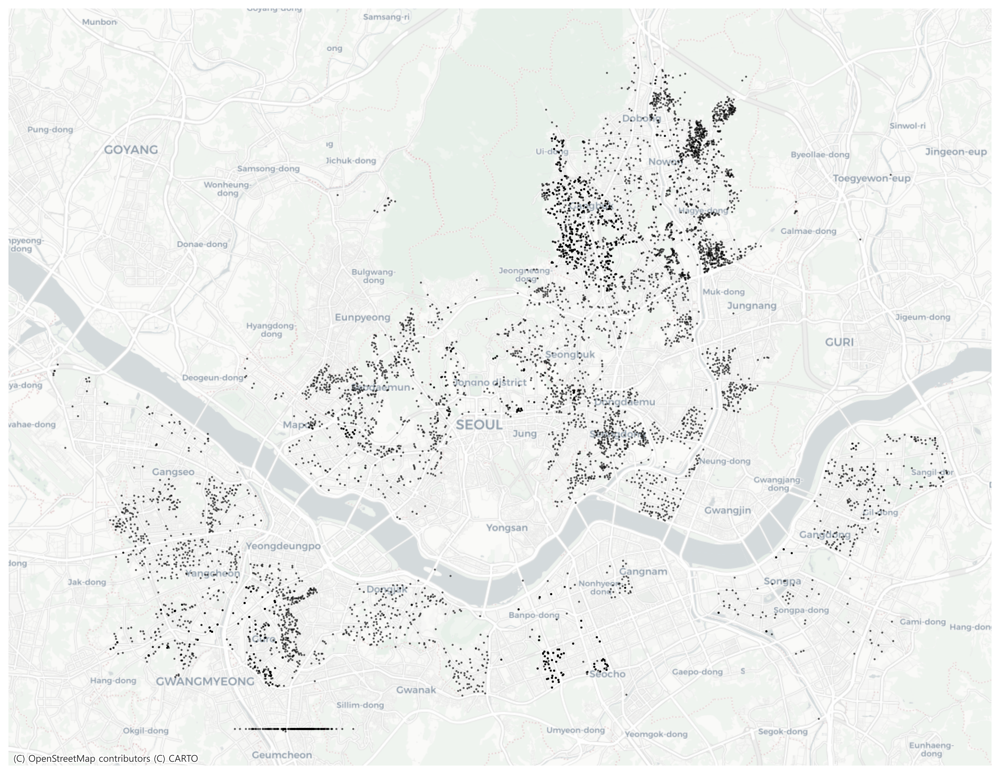

In [59]:
ax = gdf_cctv3857.plot(figsize=(15, 15), color='black', alpha=0.5, markersize=0.7)
# 배경지도 적용
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.set_axis_off()
plt.show()

### 배경맵
https://contextily.readthedocs.io/en/latest/providers_deepdive.html  

http://maps.stamen.com/#toner/13/37.5500/126.9996

## Seaborn

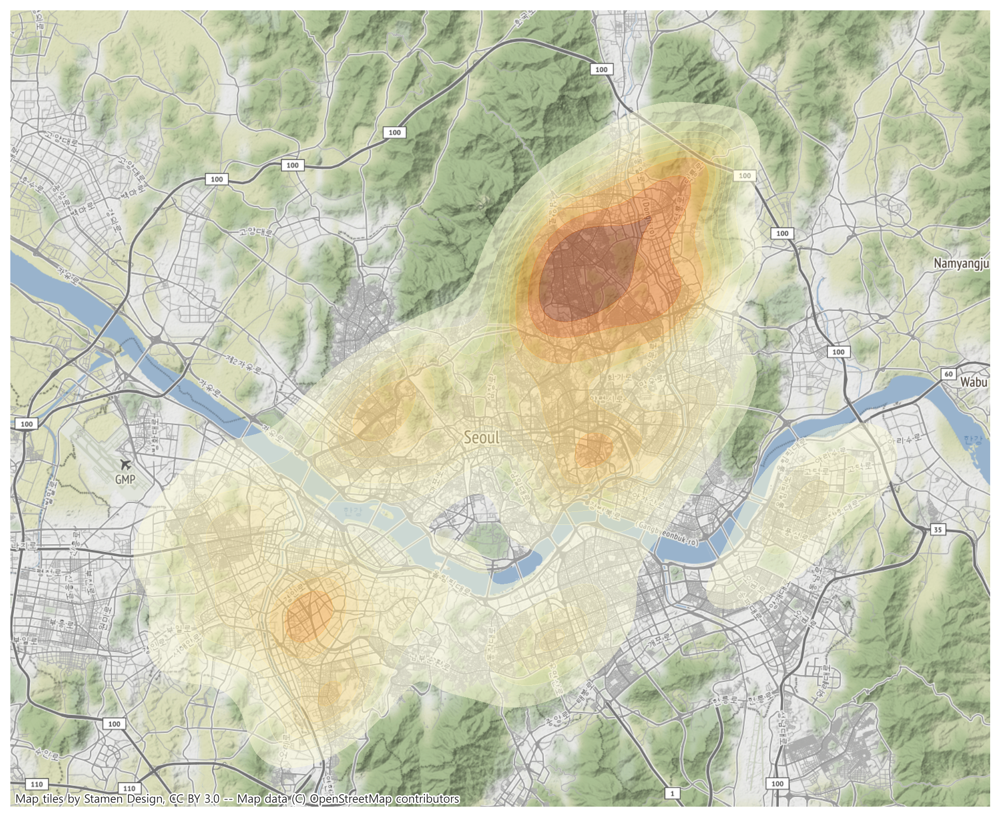

In [61]:
#Seaborn을 이용한 지리적 히트맵 
ax = sns.kdeplot(data=gdf_cctv3857, x=gdf_cctv3857["x"], y=gdf_cctv3857["y"], fill=True, cmap="YlOrBr", alpha=0.5)
ctx.add_basemap(ax, url=ctx.providers.CartoDB.DarkMatter)
ax.set_axis_off()
plt.show()

https://seaborn.pydata.org/generated/seaborn.kdeplot.html

https://seaborn.pydata.org/tutorial/color_palettes.html?highlight=colormap

### Geoplot을 이용해서도 Heatmap을 표현할 수 있습니다.
https://residentmario.github.io/geoplot/gallery/plot_nyc_collision_factors.html  
https://residentmario.github.io/geoplot/gallery/plot_boston_airbnb_kde.html  

## 수고 많으셨습니다!!!